In [1]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import GRU, Input, Dense
from tensorflow.keras.models import Model


# Define model parameters
input_shape = (2, 6)  # (timesteps, features) - adjust timesteps as needed
hidden_state_size = 120  # Hidden state size of GRU
inputs = Input(shape=(2, 6))

# Build the model
model = Sequential([
    inputs,
    GRU(units=hidden_state_size, input_shape=input_shape, return_sequences=False),
    Dense(3, activation='softmax')
])
model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])


# from tensorflow.keras.models import load_model

# model = load_model('gru_model/model_rnn_GRU.120_Dense.5010_LSTMKernelInit.VarianceScaling_DenseKernelInit.lecun_uniformKRl1.0_KRl2.0_recAct.sigmoid_weights.h5')

# new_output = model.layers[-4].output  # -4 to get three layers before the end

# # Create a new model with the same input and the modified output
# new_model = Model(inputs=model.input, outputs=new_output)

# # Compile the new model if needed
# new_model.compile(optimizer='adam', loss='sparse_categorical_crossentropy')
# model = new_model

2024-11-08 15:04:06.685033: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  SSE4.1 SSE4.2 AVX AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-11-08 15:04:09.102612: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:967] could not open file to read NUMA node: /sys/bus/pci/devices/0000:01:00.0/numa_node
Your kernel may have been built without NUMA support.
2024-11-08 15:04:09.139962: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:967] could not open file to read NUMA node: /sys/bus/pci/devices/0000:01:00.0/numa_node
Your kernel may have been built without NUMA support.
2024-11-08 15:04:09.140046: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:967] could not open file to read NUMA node: /sys/bus/pci/devices/000

In [2]:
# Display the model summary
model.summary()
model.save("gru_basic.h5")

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 gru (GRU)                   (None, 120)               46080     
                                                                 
 dense (Dense)               (None, 3)                 363       
                                                                 
Total params: 46,443
Trainable params: 46,443
Non-trainable params: 0
_________________________________________________________________


In [3]:
import hls4ml
import os
os.environ['PATH'] = '/opt/Xilinx/Vivado/2019.2/bin:' + os.environ['PATH']

/home/jiuyal2/miniconda3/envs/hls4ml-tutorial/lib/python3.10/site-packages/hls4ml/converters/__init__.py:27: UserWarning: WARNING: Pytorch converter is not enabled!
  warnings.warn("WARNING: Pytorch converter is not enabled!", stacklevel=1)


In [4]:
def print_dict(d, indent=0):
    for key, value in d.items():
        print('  ' * indent + str(key), end='')
        if isinstance(value, dict):
            print()
            print_dict(value, indent + 1)
        else:
            print(':' + ' ' * (20 - len(key) - 2 * indent) + str(value))

config = hls4ml.utils.config_from_keras_model(model, granularity='model', default_precision='ap_fixed<4,2>')
config['Model']['ReuseFactor'] = 30
config['Model']['Strategy']='Resource'
print("-----------------------------------")
print_dict(config)
print("-----------------------------------")


hls_model = hls4ml.converters.convert_from_keras_model(model,
                                                       hls_config=config,
                                                       output_dir='hls/gru_basic',
                                                       part='xcu250-figd2104-2L-e'
                                                       )

Interpreting Sequential
Topology:
Layer name: input_1, layer type: InputLayer, input shapes: [[None, 2, 6]], output shape: [None, 2, 6]
Layer name: gru, layer type: GRU, input shapes: [[None, 2, 6]], output shape: [None, 120]
Layer name: dense, layer type: Dense, input shapes: [[None, 120]], output shape: [None, 3]
-----------------------------------
Model
  Precision:         ap_fixed<4,2>
  ReuseFactor:       30
  Strategy:          Resource
  BramFactor:        1000000000
  TraceOutput:       False
-----------------------------------
Interpreting Sequential
Topology:
Layer name: input_1, layer type: InputLayer, input shapes: [[None, 2, 6]], output shape: [None, 2, 6]
Layer name: gru, layer type: GRU, input shapes: [[None, 2, 6]], output shape: [None, 120]
Layer name: dense, layer type: Dense, input shapes: [[None, 120]], output shape: [None, 3]
Creating HLS model


/home/jiuyal2/miniconda3/envs/hls4ml-tutorial/lib/python3.10/site-packages/hls4ml/backends/fpga/passes/fix_softmax_table_size.py:34: UserWarning: Softmax layer dense_softmax table size is too large for inputbitwidth 4. Setting table size to 16.To avoid this warning, please increase input bitwidth ordecrease table size.
  warnings.warn(


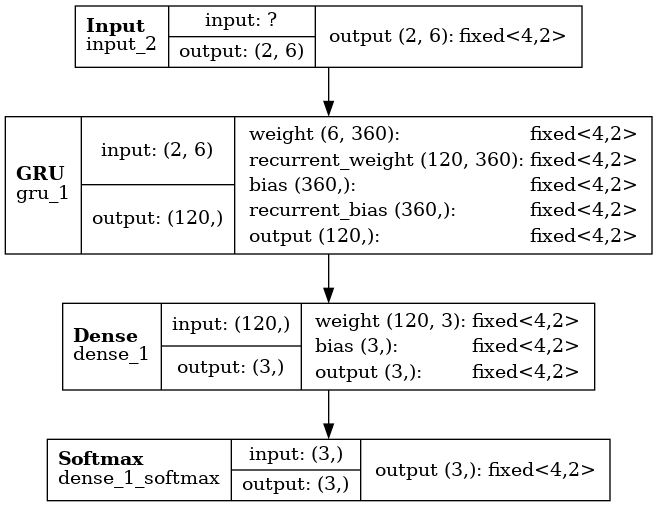

In [6]:
hls4ml.utils.plot_model(hls_model, show_shapes=True, show_precision=True, to_file=None)

In [7]:
hls_model.compile()

Writing HLS project
Done


In [8]:
hls_model.build(csim=False, synth=True, vsynth=True)


****** Vivado(TM) HLS - High-Level Synthesis from C, C++ and SystemC v2019.2 (64-bit)
  **** SW Build 2708876 on Wed Nov  6 21:39:14 MST 2019
  **** IP Build 2700528 on Thu Nov  7 00:09:20 MST 2019
    ** Copyright 1986-2019 Xilinx, Inc. All Rights Reserved.

source /tools/Xilinx/Vivado/2019.2/scripts/vivado_hls/hls.tcl -notrace
INFO: [HLS 200-10] Running '/tools/Xilinx/Vivado/2019.2/bin/unwrapped/lnx64.o/vivado_hls'
INFO: [HLS 200-10] For user 'jiuyal2' on host 'Duo16.' (Linux_x86_64 version 5.15.153.1-microsoft-standard-WSL2) on Fri Nov 08 13:45:44 PST 2024
INFO: [HLS 200-10] On os Ubuntu 24.04.1 LTS
INFO: [HLS 200-10] In directory '/home/jiuyal2/HLS4ML_VS_MANUAL/documents/Benchmarks/RNN/ftag/hls/gru_basic'
Sourcing Tcl script 'build_prj.tcl'
INFO: [HLS 200-10] Opening project '/home/jiuyal2/HLS4ML_VS_MANUAL/documents/Benchmarks/RNN/ftag/hls/gru_basic/myproject_prj'.
INFO: [HLS 200-10] Adding design file 'firmware/myproject.cpp' to the project
INFO: [HLS 200-10] Adding test bench fi

{'CSynthesisReport': {'TargetClockPeriod': '5.00',
  'EstimatedClockPeriod': '4.210',
  'BestLatency': '107',
  'WorstLatency': '110',
  'IntervalMin': '74',
  'IntervalMax': '76',
  'BRAM_18K': '350',
  'DSP': '123',
  'FF': '13042',
  'LUT': '291878',
  'URAM': '0',
  'AvailableBRAM_18K': '5376',
  'AvailableDSP': '12288',
  'AvailableFF': '3456000',
  'AvailableLUT': '1728000',
  'AvailableURAM': '1280'},
 'VivadoSynthReport': {'LUT': '17778',
  'FF': '13625',
  'BRAM_18K': '111',
  'URAM': '0',
  'DSP48E': '123'}}

In [9]:
model.save("gru_basic.h5")